#  DO's and DON'Ts of Data Visualization

In this chapter we are going to see why some types of visualizations are not a good idea.

## Set Up

In [2]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np

# this is to silence pandas' warnings
import warnings
warnings.simplefilter(action='ignore')
    
%matplotlib inline
%config InlineBackend.figure_format='svg'

#constant variables needed for the configuration of plots' appereance
FONT_SCALE = 1.3
FONT_FAMILY = 'DejaVu Sans'

## Pie Charts

Let's compare the visualizations below.

In [21]:
data_1 = np.array([17, 18, 20, 22, 24])
data_2 = np.array([20, 18, 21, 23, 23])
data_3 = np.array([28, 26, 23, 21, 21])

data = np.array([data_1, data_2, data_3])
labels = np.array(['a', 'b', 'c', 'd', 'e'])

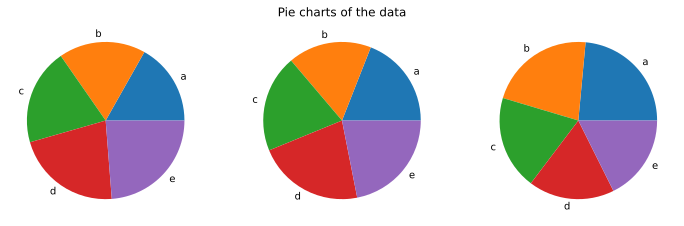

In [22]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
for i, ax in enumerate(axes):
    ax.pie(x=data[i], labels=labels)

axes[1].set_title('Pie charts of the data')
plt.show()

From the above figure can you tell the difference between the three datasets? Now let's see the corresponding barplot representation.

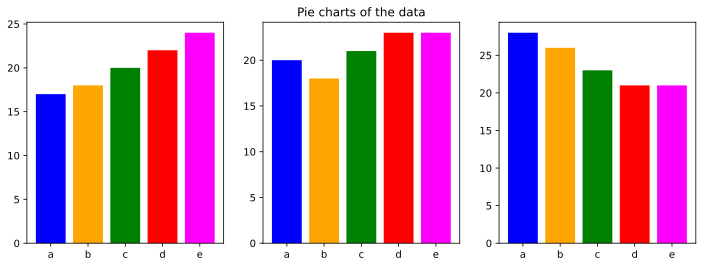

In [23]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
for i, ax in enumerate(axes):
    ax.bar(labels, data[i], color=['blue', 'orange', 'green', 'red', 'magenta'])

axes[1].set_title('Pie charts of the data')
plt.show()

Now you can clearly see that the datasets are not as similar as the pie charts show them to be.

## Sorting data

Look at the data below and choose which chart do you looks better.

In [24]:
data = pd.DataFrame({'Labels': labels, 'Values': data_2})

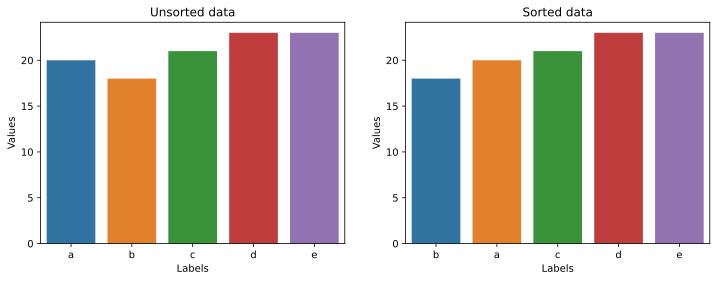

In [25]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

# unsorted
sns.barplot(data = data, x='Labels', y='Values', ax=axes[0])
# sorted
sns.barplot(data = data, x='Labels', y='Values', order=data.sort_values('Values').Labels, ax=axes[1])

axes[0].set_title('Unsorted data')
axes[1].set_title('Sorted data')

plt.show()

## Overplotting

Overplotting is something that should be avoided because it does not necessarily transmit more information. Take a look at the chart below. Can you understand where the data has come from?

In [26]:
#generating data
data_1 = pd.DataFrame({'x':np.random.normal(loc=10, scale=1.2, size=7500),
                        'y': np.random.normal(loc=10, scale=1.2, size=7500)})
data_2 = pd.DataFrame({'x':np.random.normal(loc=14.5, scale=1.2, size=7500),
                        'y': np.random.normal(loc=14.5, scale=1.2, size=7500)})
data_3 = pd.DataFrame({'x':np.random.normal(loc=9, scale=1.5, size=7500),
                        'y': np.random.normal(loc=15.5, scale=1.5, size=7500)})

data = {'data_1': data_1, 'data_2': data_2, 'data_3':data_3}


In [27]:
#plotting data
fig, axes = plt.subplots(figsize=(6, 6))
for set in data.values():
    axes.scatter(x=set['x'], y=set['y'], c='b')

### Some ways to tackle this
 - decrease point size
 - increase transparency
 - different colors for different groups 
 - subsampling

In [28]:
fig, axes = plt.subplots(nrows=2, ncols = 2, figsize=(12, 12))
colors = np.array(['b', 'r', 'g'])
for row in range(0,2):
    for col in range(0,2):
        if row==0 and col==0:
            for i, set in enumerate(data.values()):
                axes[row, col].scatter(x=set['x'], y=set['y'], c=colors[i])
            axes[row,col].set_title('Different colors for different groups')
        elif row==0 and col==1:
            for set in data.values():
                axes[row,col].scatter(x=set['x'], y=set['y'], s=0.8, c='b')
            axes[row,col].set_title('Changing size')
        elif row==1 and col==0:
            for set in data.values():
                axes[row,col].scatter(x=set['x'], y=set['y'], alpha=0.01, c='b')
            axes[row,col].set_title('Changing transparency')
        elif row==1 and col==1:
            # subsample data
            subsample_1 = data_1[:1000]
            subsample_2 = data_2[:1000]
            subsample_3 = data_3[:1000]
            subsample = {'sub_1': subsample_1, 'sub_2':subsample_2, 'sub_3': subsample_3}
            # plot data
            for set in subsample.values():
                axes[row,col].scatter(x=set['x'], y=set['y'], c='b')
            axes[row,col].set_title('Subsampling')

plt.show()


You can find more information on different strategies to deal  with overplotting [here](https://www.data-to-viz.com/caveat/overplotting.html).

## Avoid 3D plots

3D plots may seem fancy but they are difficult to understand. Instead you can substitute them with a heatmap.

In [11]:
# the data
a = [1,2,3,4]
b=[1,2,3,4]
c=[2, 2.2, 2.7, 3]

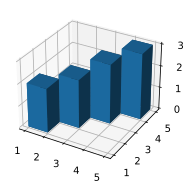

In [15]:
# 3D plot
fig = plt.figure()
ax1 = fig.add_subplot(121, projection='3d')


bottom = np.zeros_like(c)
width=depth=1
ax1.bar3d(a, b, bottom, width, depth, c)


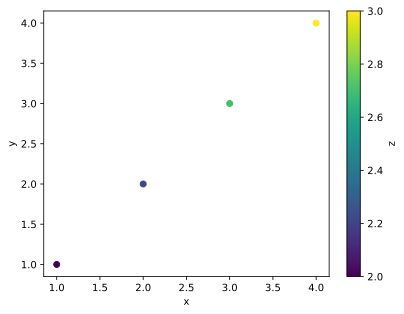

In [14]:
# heatmap version
fig, ax = plt.subplots()
sc = ax.scatter([1, 2, 3, 4], [1, 2, 3, 4], c=[2, 2.2, 2.7, 3])
ax.set_ylabel('y')
ax.set_xlabel('x')
cbar = fig.colorbar(sc)
cbar.set_label("z")

plt.show()